# Speach Recognition

If you know how neural machine translation works, you might guess that we could simply feed sound recordings into a neural network and train it to produce text. 


<img src="1.png" width=800>

That’s the holy grail of speech recognition with deep learning, but we aren’t quite there yet (at least at the time that I wrote this — I bet that we will be in a couple of years).
The big problem is that speech varies in speed. One person might say “hello!” very quickly and another person might say “heeeelllllllllllllooooo!” very slowly, producing a much longer sound file with much more data. Both both sound files should be recognized as exactly the same text — “hello!” Automatically aligning audio files of various lengths to a fixed-length piece of text turns out to be pretty hard.
To work around this, we have to use some special tricks and extra precessing in addition to a deep neural network. Let’s see how it works!



## Unstructured data to bits

### images

we know how to take an image and treat it as an array of numbers so that we can feed directly into a neural network for image recognition. Images are just arrays of numbers that encode the intensity of each pixel

In [1]:
from PIL import Image
img = Image.open("8.png")

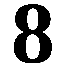

In [2]:
resized = img.resize((64,64))
resized

In [3]:
resized.resize((16,16))

In [4]:
import numpy as np
np.asarray(resized.resize((16,16)))

array([[[0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        ...,
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0]],

       [[0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        ...,
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0]],

       [[0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        ...,
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0]],

       ...,

       [[0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        ...,
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0]],

       [[0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        ...,
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0]],

       [[0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        ...,
        [0, 0, 0, 0],
        [0, 0, 0, 0],
        [0, 0, 0, 0]]], dtype=uint8)

### sound

But sound is transmitted as waves. How do we turn sound waves into numbers? Let’s use this sound clip of me saying “eight”:

Sound waves are one-dimensional. At every moment in time, they have a single value based on the height of the wave. Let’s zoom in on one tiny part of the sound wave and take a look:


In [5]:
import glob
import os
def ls(path, filesOnly=False, pattern=False):
    """
    list file(s) in @path. 
    If @filesOnly is True, directories are omitted. 
    If @pattern is True, the function will treat the path as 
    a pattern and list all files and directories that satisfy it.
    """
    if pattern:
        return glob.glob(path)
    if filesOnly:
        files = [ f for f in os.listdir(path) if is_file(os.path.join(path,f)) ]
    else:
        files = [ f for f in os.listdir(path)]
    return files

In [6]:
dataset = "./free-spoken-digit-dataset/recordings/"
eightdataset = ls(f"{dataset}/*_8.wav", pattern=True)
jacksoneight = f'{dataset}/0_jackson_8.wav'

In [7]:
# opening wav file
import wave
spf = wave.open(jacksoneight,'r')

In [8]:
#Extract Raw Audio from Wav File
signal = spf.readframes(-1)
signal = np.fromstring(signal, 'Int16')

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Numeric-style type codes are deprecated and will result in an error in the future.
  This is separate from the ipykernel package so we can avoid doing imports until
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  This is separate from the ipykernel package so we can avoid doing imports until


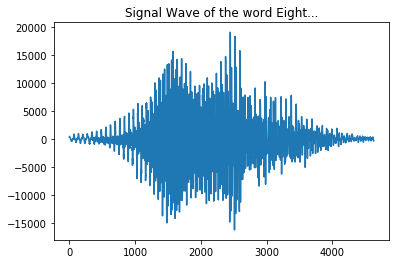

In [9]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.figure(1)
plt.title('Signal Wave of the word Eight...')
plt.plot(signal)
plt.show()

Sound waves are one-dimensional. At every moment in time, they have a single value based on the height of the wave. Let’s zoom in on one tiny part of the sound wave and take a look:

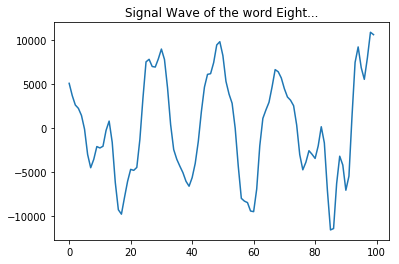

In [10]:
plt.figure(1)
plt.title('Signal Wave of the word Eight...')
plt.plot(signal[2000:2100])
plt.show()

To turn this sound wave into numbers, we just record of the height of the wave at equally-spaced points:=

## Pre-Processing our Sampled Sound Data

We now have an array of numbers with each number representing the sound wave’s amplitude at 1/16,000th of a second intervals.

We could feed these numbers right into a neural network. But trying to recognize speech patterns by processing these samples directly is difficult. Instead, we can make the problem easier by doing some pre-processing on the audio data.

Let’s start by grouping our sampled audio into 20-millisecond-long chunks.

In [11]:
s = 20
chunksize = int(s*spf.getframerate()/1000) # to millisecond
new_size = int(signal.shape[0]/chunksize)*chunksize
signal2 = signal[:new_size]
groups = signal2.reshape((-1,chunksize))

Here’s our first 20 milliseconds of audio (i.e., our first 320 samples):

In [12]:
groups[0]

array([ 330,  382,  389,  401,  429,  426,  390,  405,  379,  338,  303,
        262,  202,  162,  133,   77,   37,   26,   39,  -35,  -56,  -67,
        -94, -132, -128, -201, -238, -258, -282, -319, -369, -371, -425,
       -407, -433, -398, -454, -408, -411, -374, -340, -329, -275, -250,
       -176, -163, -113,  -74,  -39,   -1,   -6,    3,   -5,    9,  -26,
        -22,  -27,  -72,  -97,  -70,  -69,  -30,   65,  141,  229,  344,
        448,  527,  652,  738,  781,  799,  827,  777,  696,  626,  526,
        420,  349,  273,  172,   95,   49,  -39,  -41,  -77,  -83, -103,
       -103,  -96, -149, -181, -206, -249, -296, -342, -400, -498, -491,
       -574, -584, -623, -605, -624, -601, -542, -552, -450, -448, -298,
       -309, -164, -174,  -86,  -54,   32,   22,   48,   90,   45,   68,
         25,   19,  -44,  -31,  -75,  -86,  -99,  -75,  -14,   37,  180,
        264,  425,  540,  684,  761,  842,  909,  926,  912,  861,  814,
        707,  620,  462,  359,  246,  182,   58,   

Plotting those numbers as a simple line graph gives us a rough approximation of the original sound wave for that 20 millisecond period of time:

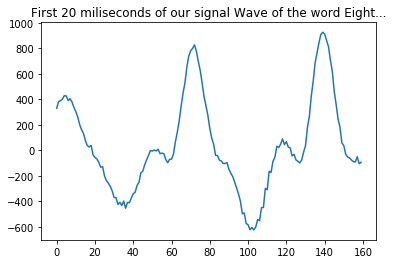

In [13]:
plt.figure(1)
plt.title('First 20 miliseconds of our signal Wave of the word Eight...')
plt.plot(groups[0])
plt.show()

This recording is only 1/50th of a second long. But even this short recording is a complex mish-mash of different frequencies of sound. There’s some low sounds, some mid-range sounds, and even some high-pitched sounds sprinkled in. But taken all together, these different frequencies mix together to make up the complex sound of human speech.

To make this data easier for a neural network to process, we are going to break apart this complex sound wave into it’s component parts. We’ll break out the low-pitched parts, the next-lowest-pitched-parts, and so on. Then by adding up how much energy is in each of those frequency bands (from low to high), we create a fingerprint of sorts for this audio snippet.


Imagine you had a recording of someone playing a C Major chord on a piano. That sound is the combination of three musical notes— C, E and G — all mixed together into one complex sound. We want to break apart that complex sound into the individual notes to discover that they were C, E and G. This is the exact same idea.


We do this using a mathematic operation called a Fourier transform. It breaks apart the complex sound wave into the simple sound waves that make it up. Once we have those individual sound waves, we add up how much energy is contained in each one.

In [14]:
from scipy.fftpack import fft, ifft
f_groups = np.abs(fft(groups))
f_groups[0]

array([6.67400000e+03, 8.69888753e+03, 2.97156817e+04, 1.74228920e+04,
       2.08076387e+03, 1.39439784e+04, 6.32557333e+03, 1.49408718e+04,
       1.36028883e+03, 2.64675231e+03, 2.14534530e+03, 1.01215301e+03,
       1.29659123e+03, 6.82834523e+02, 6.18778534e+02, 6.80732948e+02,
       8.02409364e+02, 6.71120484e+02, 8.50987029e+02, 5.28060606e+02,
       5.43316265e+02, 6.85177623e+02, 4.69311469e+02, 4.99920977e+02,
       5.10363544e+02, 3.72247749e+02, 4.33962762e+02, 4.09792498e+02,
       4.59258519e+02, 5.56564313e+02, 3.04994862e+02, 3.94201222e+02,
       2.22212739e+02, 2.58344414e+02, 3.24063286e+02, 4.15371855e+02,
       4.56838823e+02, 4.56278934e+02, 5.05370078e+02, 2.63081468e+02,
       3.40164666e+02, 3.23029631e+02, 2.94793959e+02, 2.74204394e+02,
       3.49393553e+02, 4.12172313e+02, 4.95072725e+02, 5.55243041e+02,
       2.98243547e+02, 7.37158828e+02, 2.63656945e+01, 2.76237080e+02,
       3.55344022e+02, 2.29306954e+02, 2.58749584e+02, 1.77869120e+02,
      

The end result is a score of how important each frequency range is, from low pitch (i.e. bass notes) to high pitch. Each number below represents how much energy was in each 50hz band of our 20 millisecond audio clip:


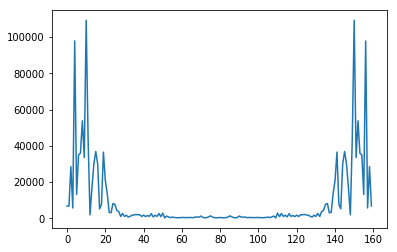

In [15]:
index = 22
plt.plot(f_groups[index])

But this is a lot easier to see when you draw this as a chart:

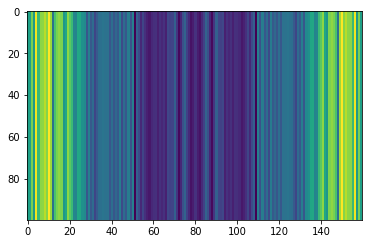

In [16]:
data = np.repeat(f_groups[index],100).reshape(-1,100)
plt.imshow(np.log(data).T)

If we repeat this process on every 20 millisecond chunk of audio, we end up with a spectrogram (each column from left-to-right is one 20ms chunk):


A spectrogram is cool because you can actually see musical notes and other pitch patterns in audio data. A neural network can find patterns in this kind of data more easily than raw sound waves. So this is the data representation we’ll actually feed into our neural network.

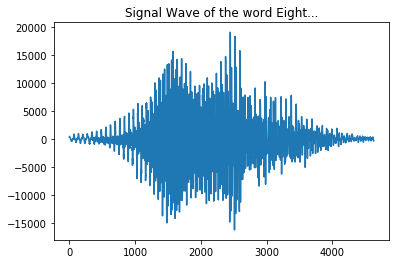

In [17]:
plt.figure(1)
plt.title('Signal Wave of the word Eight...')
plt.plot(signal)
plt.show()

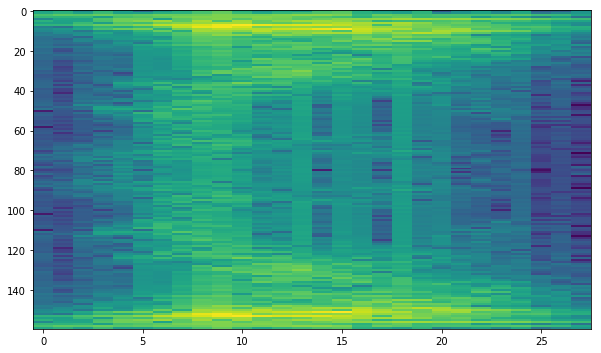

In [18]:
plt.imshow(np.log(f_groups).T,aspect=0.1)
plt.gcf().set_size_inches((10,10))

### Spectrum of other speakers

First lets create a function to load the spectrum of multiple files

In [19]:
import glob
import warnings
warnings.filterwarnings('ignore')
def load_spectrum(dataset,chunklength = 20):
    spectrums = []
    for f in dataset:
        spf = wave.open(f,'r')
        signal = spf.readframes(-1)
        signal = np.fromstring(signal, 'Int16')
        chunksize = int(chunklength*spf.getframerate()/1000) # to millisecond
        new_size = int(signal.shape[0]/chunksize)*chunksize
        groups = signal[:new_size].reshape((-1,chunksize))
        f_groups = np.abs(fft(groups))
        spectrums.append(f_groups)
    return np.array(spectrums)

Now we can use this function to load the spectrum of all files in a directory. We will load the spectrum of the word `seven` and `eight`

In [20]:
# load the word eight
spectrums_eight = load_spectrum(eightdataset)

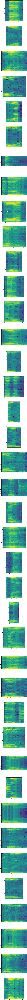

In [21]:
# plot the word eight spoken by different speakers
fig, ax = plt.subplots(nrows=spectrums_eight.shape[0])
fig.set_size_inches((10,10*spectrums_eight.shape[0]))
for i in range(spectrums_eight.shape[0]):
    ax[i].imshow(np.log(spectrums_eight[i].T),aspect=0.1)

In [22]:
# load the word seven spoken by different speakers
spectrums_seven = load_spectrum(ls(f"{dataset}/*_7.wav",pattern=True))

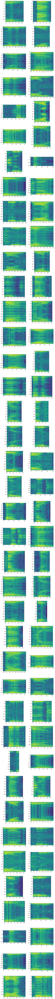

In [23]:
# plot word seven and eight side by side
fig, ax = plt.subplots(nrows=spectrums_seven.shape[0],ncols=2)
fig.set_size_inches((10,5*spectrums_seven.shape[0]))
min_shape = min([spectrums_seven.shape[0],spectrums_eight.shape[0]])
for i in range(min_shape):
    ax[i,0].imshow(np.log(spectrums_seven[i].T),aspect=0.1)
    ax[i,1].imshow(np.log(spectrums_eight[i].T),aspect=0.1)

## Simple CNN to classify Seven vs Eight

To classify wether a spoken word is seven or eight using CNN, we need first to acquire spectrums as images

In [24]:
import io
def to_pil(figure,dpi=128):
    buf = io.BytesIO()
    figure.savefig(buf,dpi=dpi,format='jpeg',
    transparent=True,bbox_inches='tight',pad_inches=0)
    buf.seek(0)
    return Image.open(buf).resize((224,224))

def transform(data,labels=["Seven","Eight"]):
    imgs = []
    _labels = []
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            plt.imshow(np.log(data[i,j].T),aspect=0.1)
            plt.axis('off')
            plt.tick_params(axis='both', left='off', top='off', right='off', bottom='off', labelleft='off', labeltop='off', labelright='off', labelbottom='off')
            imgs.append(to_pil(plt.gcf()))
            _labels.append(labels[i])
    return imgs,_labels

In [25]:
data = np.append(np.expand_dims(spectrums_seven[:min_shape],axis=0),
                 np.expand_dims(spectrums_eight[:min_shape],axis=0),axis=0)

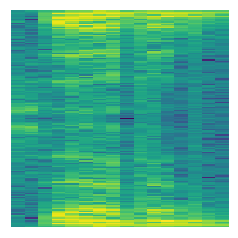

In [26]:
imgs,labels = transform(data)

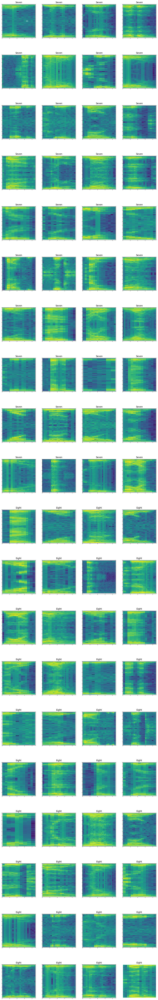

In [27]:
ncols = 4
nrows = int(len(imgs)/ncols)
fig, ax = plt.subplots(nrows=nrows, ncols=ncols)
fig.set_size_inches((15,nrows*5))
plt.axis('off')
plt.tick_params(axis='both', left='off', top='off', right='off', bottom='off', labelleft='off', labeltop='off', labelright='off', labelbottom='off')
for i,im in enumerate(imgs):
    ax[int(i/ncols),i%ncols].imshow(im)
    ax[int(i/ncols),i%ncols].xaxis.set_major_formatter(plt.NullFormatter())
    ax[int(i/ncols),i%ncols].yaxis.set_major_formatter(plt.NullFormatter())
    ax[int(i/ncols),i%ncols].set_title(labels[i])

### Deep learning model

In [65]:
from numpy import asarray
from keras.preprocessing.image import img_to_array

Using TensorFlow backend.


ImportError: Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/tensorflow/python/pywrap_tensorflow.py", line 41, in <module>
    from tensorflow.python.pywrap_tensorflow_internal import *
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/tensorflow/python/pywrap_tensorflow_internal.py", line 28, in <module>
    _pywrap_tensorflow_internal = swig_import_helper()
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/tensorflow/python/pywrap_tensorflow_internal.py", line 24, in swig_import_helper
    _mod = imp.load_module('_pywrap_tensorflow_internal', fp, pathname, description)
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/imp.py", line 243, in load_module
    return load_dynamic(name, filename, file)
  File "/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/imp.py", line 343, in load_dynamic
    return _load(spec)
ImportError: dlopen(/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/tensorflow/python/_pywrap_tensorflow_internal.so, 10): Library not loaded: @rpath/libcublas.8.0.dylib
  Referenced from: /Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/tensorflow/python/_pywrap_tensorflow_internal.so
  Reason: image not found


Failed to load the native TensorFlow runtime.

See https://www.tensorflow.org/install/install_sources#common_installation_problems

for some common reasons and solutions.  Include the entire stack trace
above this error message when asking for help.

In [66]:
imgs_array = [img_to_array(img) for img in imgs]
photos = asarray(imgs_array)
labels_names = labels
labels_onehot = np.array([[1,0] if l == "Seven" else [0,1] for l in labels_names])

NameError: name 'img_to_array' is not defined

In [446]:
from keras.applications.vgg16 import VGG16
# load model
base_model = VGG16(include_top=False,weights="vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5",input_shape=(224,224,3))
# add a global spatial average pooling layer
x = base_model.output
x = GlobalAveragePooling2D()(x)
# let's add a fully-connected layer
x = Dense(1024, activation='relu')(x)
# and a logistic layer -- let's say we have 200 classes
predictions = Dense(2, activation='softmax')(x)

# this is the model we will train
model = Model(inputs=base_model.input, outputs=predictions)

# first: train only the top layers (which were randomly initialized)
# i.e. freeze all convolutional InceptionV3 layers
for layer in base_model.layers:
    layer.trainable = False

# compile the model (should be done *after* setting layers to non-trainable)
model.compile(optimizer='adam', loss='binary_crossentropy')

In [447]:
# selecting 70% for training 
train_index = np.random.choice(photos.shape[0],int(photos.shape[0]*0.7),replace=False)
model.fit(photos[train_index],labels_onehot[train_index],epochs=15)

Epoch 1/15
19/19 [==============================] - 14s 749ms/step - loss: 0.6635
Epoch 2/15
19/19 [==============================] - 8s 440ms/step - loss: 8.2950
Epoch 3/15
19/19 [==============================] - 9s 449ms/step - loss: 3.6055
Epoch 4/15
19/19 [==============================] - 8s 441ms/step - loss: 0.4855
Epoch 5/15
19/19 [==============================] - 8s 437ms/step - loss: 2.2732
Epoch 6/15
19/19 [==============================] - 8s 428ms/step - loss: 2.4718
Epoch 7/15
19/19 [==============================] - 9s 454ms/step - loss: 1.5490
Epoch 8/15
19/19 [==============================] - 8s 441ms/step - loss: 0.3625
Epoch 9/15
19/19 [==============================] - 8s 438ms/step - loss: 0.0686
Epoch 10/15
19/19 [==============================] - 8s 439ms/step - loss: 0.4644
Epoch 11/15
19/19 [==============================] - 8s 439ms/step - loss: 0.8984
Epoch 12/15
19/19 [==============================] - 8s 441ms/step - loss: 0.6749
Epoch 13/15
19/19 [=====

In [451]:
prediction = model.predict(photos)

In [452]:
prediction = ["Seven" if p == 0 else "Eight" for p in np.argmax(prediction,axis=1)]

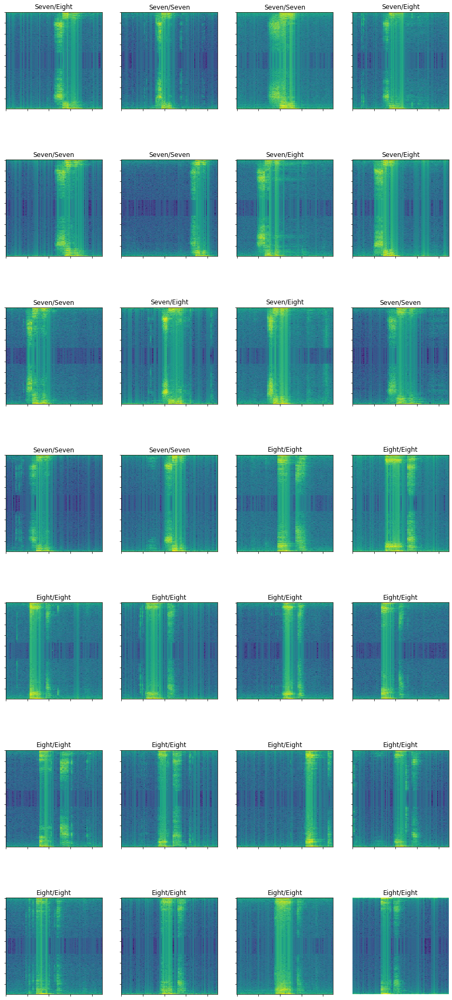

In [454]:
ncols = 4
nrows = int(len(imgs)/ncols)
fig, ax = plt.subplots(nrows=nrows, ncols=ncols)
fig.set_size_inches((15,nrows*5))
plt.axis('off')
plt.tick_params(axis='both', left='off', top='off', right='off', bottom='off', labelleft='off', labeltop='off', labelright='off', labelbottom='off')
for i,im in enumerate(imgs):
    ax[int(i/ncols),i%ncols].imshow(im)
    ax[int(i/ncols),i%ncols].xaxis.set_major_formatter(plt.NullFormatter())
    ax[int(i/ncols),i%ncols].yaxis.set_major_formatter(plt.NullFormatter())
    p = prediction[i]
    a = labels_names[i]
    ax[int(i/ncols),i%ncols].set_title(f'{a}/{p}')